# **MultiClass Dog Breed Classifier**

The project aims to classify images of dogs by training a mobile net network

In [1]:
#!unzip "/content/drive/MyDrive/dog-vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/dog-vision/"

In [2]:
pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0

# **Getting the workspace ready**

In [3]:
#import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version: ",tf.__version__)
print("TF Hub Version: ",hub.__version__)
#Checking for GPU availability
print("GPU","available(YESSSSS!)" if tf.config.list_physical_devices("GPU") else "not available:(")

TF Version:  2.15.0
TF Hub Version:  0.16.1
GPU available(YESSSSS!)


# **Getting the Data ready!**

In [4]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/dog-vision/labels.csv")
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


In [5]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [6]:
print("Total number of breeds = ",len(labels_csv["breed"].unique()))

Total number of breeds =  120


In [7]:
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


<Axes: xlabel='breed'>

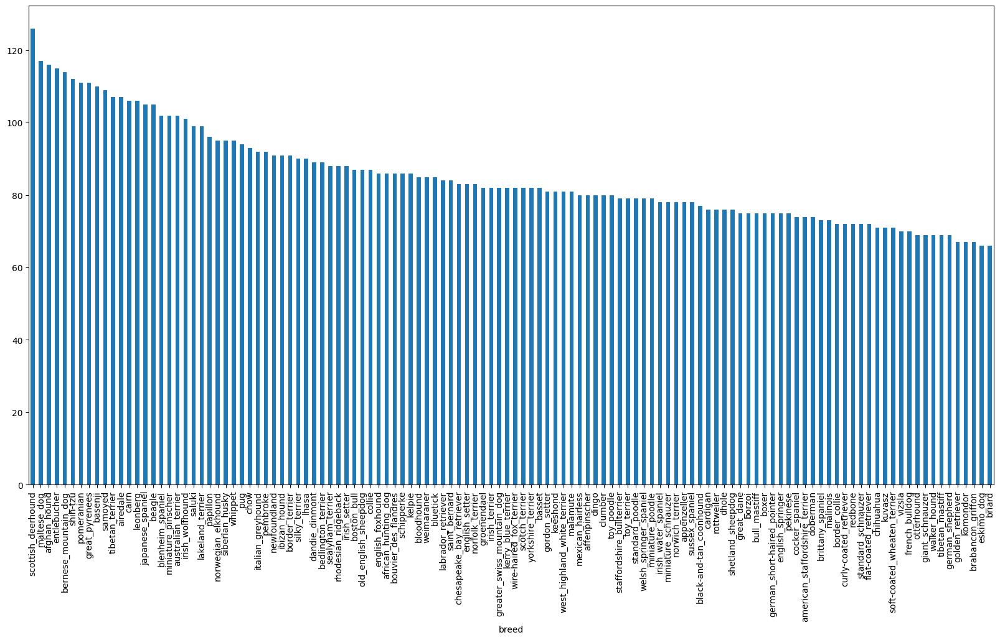

In [8]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [9]:
print("Median value per class ",labels_csv["breed"].value_counts().median())
print("Mean value per class ",labels_csv["breed"].value_counts().mean())

Median value per class  82.0
Mean value per class  85.18333333333334


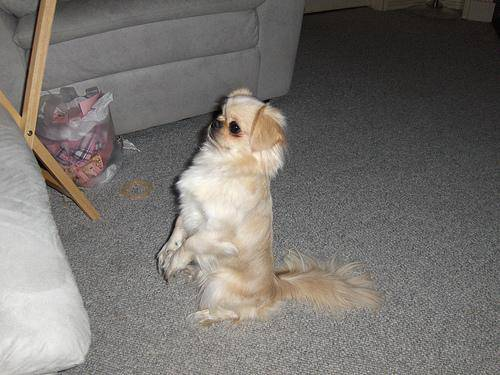

In [10]:
#viewing an image
from IPython.display import Image
Image("/content/drive/MyDrive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg")

In [11]:
filenames = ["/content/drive/MyDrive/dog-vision/train/" + fname + ".jpg" for fname in labels_csv['id']]
filenames[:10]

['/content/drive/MyDrive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [12]:
#Checking if the number of files in folder mathches with filenames in code
import os
if(len(os.listdir("/content/drive/MyDrive/dog-vision/train"))==len(filenames)):
  print("Same length. Proceed!")
else:
  print("Oops! Something is wrong.")

Same length. Proceed!


### **Turning labels into numbers**

In [13]:
#getting all the labels
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [15]:
#check if labels length is equal to number of ids
if(len(labels)==len(filenames)):
  print("Same length. Proceed!")
else:
  print("Oops! Something is wrong.")

Same length. Proceed!


In [16]:
#Converting labels into array of booleans
#labels[0] == unique_breeds
boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [17]:
print(labels[0])#actual label
print(np.where(unique_breeds == labels[0])[0][0]) #index where label is present in the unique breeds array
print(boolean_labels[0].argmax())#array of label in the boolean array
print(boolean_labels[0].astype(int)) #in terms of 0s and 1s

boston_bull
19
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


# Creating our validation set


In [18]:
#Setting up the X and y variables
X = filenames
y = boolean_labels

In [19]:
#Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param{type: "slider", min: 1000,max: 10000,step:1000}

In [20]:
from sklearn.model_selection import train_test_split
#training on subset of actual dataset
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [21]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[0]) # read in an image
image.shape

(375, 500, 3)

# **PREPROCESSING IMAGES**(Turning images into tensors)


Preprocessing function performs the following tasks:


1.   Take an image filepath as input
2.   Use TensorFlow to read the path and save into a variable (image)
3.   Turn image(a jpeg) into tensors
4.   Normalize the images (scale the color values (0-255) to 0-1)
5.   Resize image to a size
6.   Return modified image









In [22]:
import tensorflow as tf

#setting image size
IMG_SIZE=224

In [23]:
def process_image(image_path, img_size =IMG_SIZE ):
  #using TF to read the path contents
  image = tf.io.read_file(image_path)
  #converting to tensors
  image = tf.image.decode_jpeg(image,channels=3)
  #normalizing image
  image = tf.image.convert_image_dtype(image,tf.float32)
  #resizing
  image = tf.image.resize(image,[img_size,img_size])

  return image

#Creating a function to return tuple of tensors in format (image, labels)

In [24]:
def get_image_labels(image_path,label):
  image = process_image(image_path)
  return image,label

In [25]:
get_image_labels(X[20],tf.constant(y[20]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.4686362 , 0.48284388, 0.4388923 ],
         [0.43491846, 0.46069017, 0.4125102 ],
         [0.45447832, 0.4979307 , 0.44302875],
         ...,
         [0.43456125, 0.5049195 , 0.28860298],
         [0.39823228, 0.4980573 , 0.26960978],
         [0.37409884, 0.48390275, 0.24988663]],
 
        [[0.43431306, 0.46279556, 0.4211807 ],
         [0.43068317, 0.4688092 , 0.42564145],
         [0.45039746, 0.49808303, 0.45071962],
         ...,
         [0.43917897, 0.51070905, 0.3056251 ],
         [0.3906706 , 0.4944172 , 0.2534024 ],
         [0.34645557, 0.4601811 , 0.20911317]],
 
        [[0.41501755, 0.4622952 , 0.4238247 ],
         [0.40084037, 0.4505865 , 0.40968493],
         [0.44426945, 0.4941148 , 0.45284492],
         ...,
         [0.4272146 , 0.50133634, 0.31526017],
         [0.38620418, 0.48767138, 0.25313336],
         [0.33333334, 0.44705886, 0.19360997]],
 
        ...,
 
        [[0.8738844 , 0.8699628 

# **MINI BATCHES**
Using mini batches for effective processing of tensors

Creating a function to create batches for:


1.   Test Set (only filepaths no labels)
2.   Validation Set (both filepath and labels but no shuffling)
3.   Training Set (both filepath and labels with shuffling)



In [26]:
#defining batch size
BATCH_SIZE = 32

In [27]:
def create_data_batches(X, y=None, valid_data=False, test_data=False):

  if test_data:
    print("Creating batches for test data...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE) # applying the process_image function to every tensor and then creating batches
    return data_batch

  elif valid_data:
    print("Creating batches for valid data...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    #mapping the get_image_labels() function as we require both X and Y variables
    data_batch = data.map(get_image_labels).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating batches for training data...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    #shuffling with filenames is faster than shuffling images(after map())
    data = data.shuffle(buffer_size=len(X))
    #mapping the get_image_labels() function as we require both X and Y variables
    data_batch = data.map(get_image_labels).batch(BATCH_SIZE)
    return data_batch





In [28]:
train_data = create_data_batches(X_train,y_train)
valid_data = create_data_batches(X_val,y_val,valid_data=True)

Creating batches for training data...
Creating batches for valid data...


In [29]:
#checking different attributes of our data batches
train_data.element_spec,valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [30]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

##**Visualizing our data batches**

In [31]:
import matplotlib.pyplot as plt

def show_images(images,labels):
  plt.figure(figsize=(10,10))
  #show image
  for i in range(20):
    ax = plt.subplot(5,4,i+1) #subplot with 5 rows and 4 columns
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.tight_layout()


In [32]:
#converting batch to iterator
train_images , train_labels = next(train_data.as_numpy_iterator())
len(train_images),len(train_labels)

(32, 32)

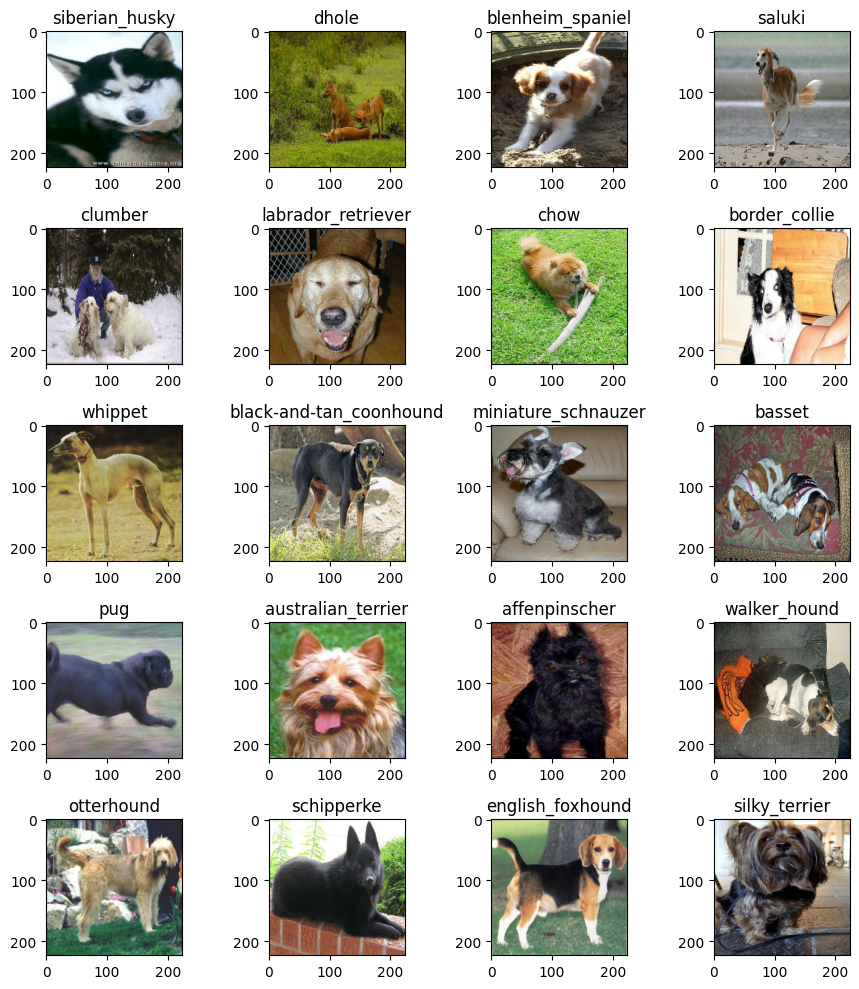

In [33]:
#visualizing 20 images from the training dataset
show_images(train_images , train_labels)

In [34]:
val_images , val_labels = next(train_data.as_numpy_iterator())
len(val_images),len(val_labels)

(32, 32)

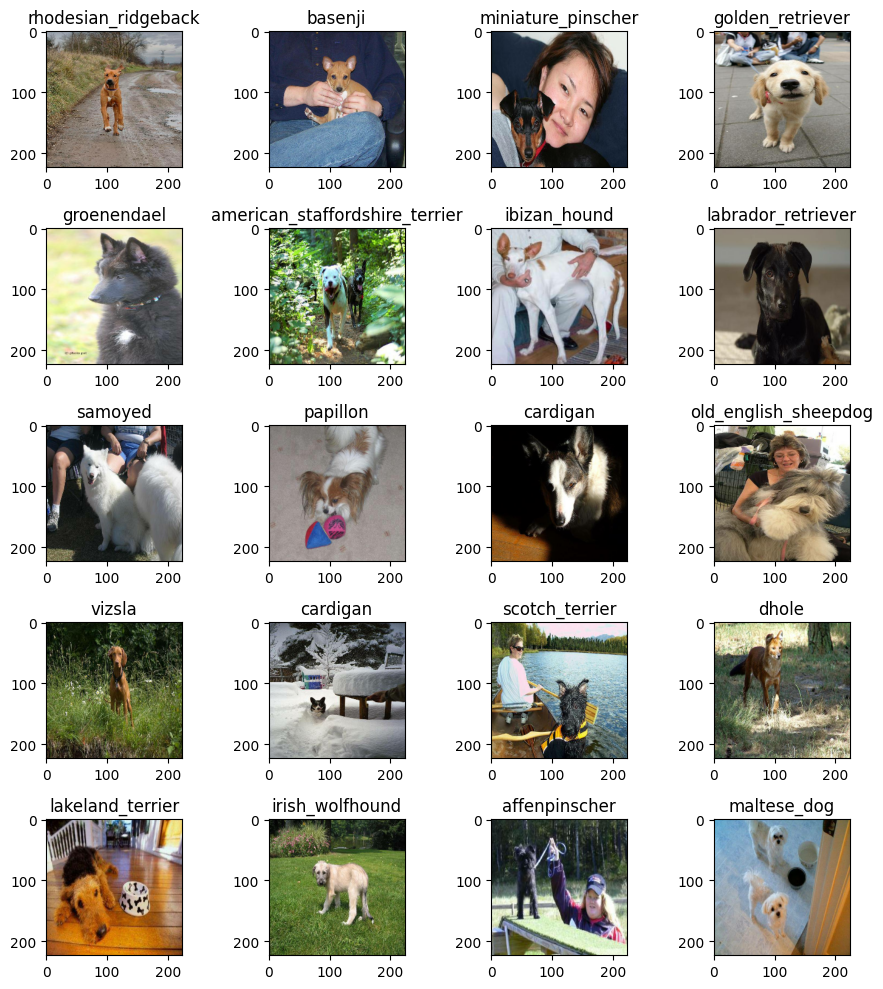

In [35]:
#visualizing 20 images from the validation dataset
show_images(val_images , val_labels)

# **Modelling**
*  input size(images shape in form of tensors)
*  output size(labels in form of tensors)
*  URL of the model we want to use (transfer learning) from TensorFlowHub


In [36]:
len(unique_breeds)

120

In [37]:
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3]
OUTPUT_SHAPE = len(unique_breeds)
# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

**The create_model() function does the following:**
* Takes the input shape, output shape and the model we've chosen's URL as
parameters.
* Defines the layers in a Keras model in a sequential fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells it what kind of input shape it'll be getting).
* Returns the model.

In [38]:
def create_model(input_shape = INPUT_SHAPE, ouput_shape= OUTPUT_SHAPE, model_url = MODEL_URL):

  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), #layer 1(input layer)
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation="softmax" #multiclass classification
                            ) #layer 2(output layer)
  ])

  #model compilation
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),#multiclass classification
      optimizer = tf.keras.optimizers.Adam(),
      metrics= ['accuracy'] #classification problem
  )

  model.build(INPUT_SHAPE)
  return model


In [39]:
model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


# **Callbacks**


*   TensorBoard Callback to track model progress
*   Early stopping to prevent overfitting



In [40]:
%load_ext tensorboard

In [41]:
import datetime

#tensorboard callback
def create_tensorboard_callbacks():
  #create a directory to store the logs
  logdir = os.path.join('/content/drive/MyDrive/dog-vision/logs' ,
                        #Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

#early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=3)

# **Model Training**

In [42]:
NUM_EPOCHS = 100 #@param{type: "slider", min: 10,max: 100,step:10}

In [43]:
def train_model():

  #create model
  model = create_model()

  #tensorboard callback
  tensorboard = create_tensorboard_callbacks()

  #fitting the model
  model.fit(x=train_data,
            epochs = NUM_EPOCHS,
            validation_data = valid_data,
            callbacks = [tensorboard, early_stopping])

  return model

In [44]:
#fit model to data
model = train_model()

Epoch 1/100
25/25 [==============================] - 127s 3s/step - loss: 4.5249 - accuracy: 0.1037 - val_loss: 3.4332 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 4s 165ms/step - loss: 1.6292 - accuracy: 0.6687 - val_loss: 2.1809 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 4s 144ms/step - loss: 0.5662 - accuracy: 0.9362 - val_loss: 1.6560 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 6s 219ms/step - loss: 0.2573 - accuracy: 0.9875 - val_loss: 1.4827 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 4s 163ms/step - loss: 0.1450 - accuracy: 0.9937 - val_loss: 1.4102 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 4s 146ms/step - loss: 0.0996 - accuracy: 1.0000 - val_loss: 1.3627 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================] - 6s 222ms/step - loss: 0.0754 - accuracy: 1.0000 - val_loss: 1.3340 - val_accuracy: 0.6400


**Checking our tensorboard logs**

In [45]:
%tensorboard --logdir /content/drive/MyDrive/dog-vision/logs

<IPython.core.display.Javascript object>

**Making predictions**

In [46]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(valid_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 [==============================] - 2s 167ms/step


array([[3.3377369e-03, 5.4082764e-05, 2.5819789e-04, ..., 2.2122930e-04,
        1.0187952e-05, 6.2704743e-03],
       [3.0981489e-03, 1.8983023e-04, 2.9667807e-03, ..., 7.8050297e-04,
        1.1144842e-03, 5.9820584e-04],
       [4.2101470e-05, 2.0210120e-05, 1.3969000e-05, ..., 2.0399762e-04,
        8.7867244e-05, 7.0036505e-04],
       ...,
       [1.0673462e-05, 1.0224595e-04, 6.2808858e-06, ..., 1.5114149e-05,
        7.8439225e-06, 1.3558066e-04],
       [3.7751875e-03, 2.0999962e-04, 6.9947520e-05, ..., 3.8350624e-04,
        1.2008985e-04, 7.8704255e-03],
       [1.0408147e-03, 4.6890586e-05, 9.0806196e-03, ..., 2.7529176e-02,
        8.0961274e-04, 7.3777963e-05]], dtype=float32)

In [47]:
predictions.shape

(200, 120)

In [48]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label

[3.33773694e-03 5.40827641e-05 2.58197892e-04 4.74829831e-05
 2.18282730e-04 1.24474009e-05 8.16065259e-03 1.38083822e-04
 9.38662415e-05 2.99552397e-04 1.01347170e-04 5.36716652e-05
 9.00276791e-05 1.54254813e-05 1.80539108e-04 3.68286768e-04
 4.39924406e-06 1.28072590e-01 3.77717370e-05 3.43273314e-05
 1.86507503e-04 2.25914220e-04 2.44930361e-05 1.97345449e-04
 5.27265038e-05 1.02438653e-05 4.83021766e-01 1.98533471e-05
 6.82199956e-04 5.06047683e-04 2.09853068e-04 2.80381239e-04
 4.63622127e-05 1.29125010e-05 1.94619512e-04 5.49415722e-02
 3.96532232e-06 3.81378253e-04 5.58769570e-05 4.06070685e-05
 8.44376627e-04 1.55228063e-05 5.17018962e-05 3.73365947e-05
 7.84628628e-06 9.48932211e-05 4.29228348e-05 2.13234045e-04
 4.51690372e-04 2.81103166e-05 3.51017588e-05 4.92344116e-05
 4.66070080e-04 8.81872547e-05 8.05035088e-05 4.38593743e-05
 1.39471362e-04 8.07716278e-04 1.47130559e-04 6.59007132e-02
 4.12430745e-05 1.08116488e-04 1.69646740e-03 1.85187546e-05
 7.08342704e-04 3.332972

In [49]:
def get_pred_label(predicted_probabilities):
  return unique_breeds[np.argmax(predicted_probabilities)]

pred_label = get_pred_label(predictions[1])
pred_label

'miniature_schnauzer'

# **Unbatching the valid data images**

Comparing the predicted label with the actual label using our validation dataset

In [50]:
def unbatchify(data):
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

val_images, val_labels = unbatchify(valid_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [51]:
get_pred_label(predictions[0])

'cairn'

In [52]:
val_labels[0]

'cairn'

# **Visualizing model predictions**

Create a function which:


*   Takes in the prediction probabilities, array of true labels and images and integers
*   Convert predicted probabilities into labels
*   Plot predicted label, its probability, actual label and the image in a single plot



In [53]:
def plot_pred(prediction_probabilities, labels, images, n):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob,true_label,img = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)
  # Plot image & remove ticks
  plt.imshow(img)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)


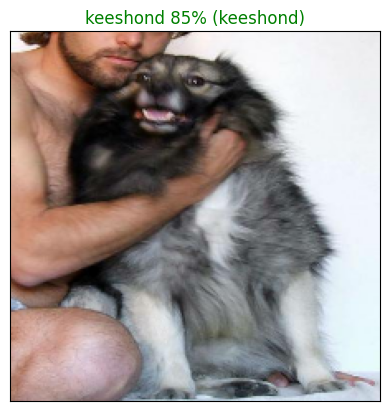

In [54]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=6
          )

In [55]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

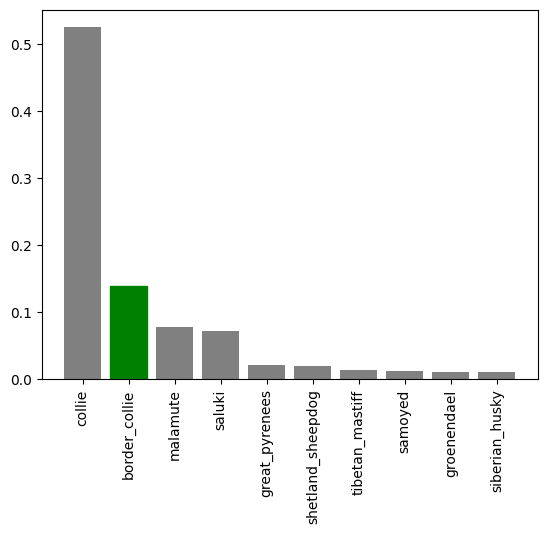

In [56]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

# **Saving and Reloading the model**

In [57]:
#creating a function to save the model

def save_model(model, suffix=None):
  modeldir = os.path.join('/content/drive/MyDrive/dog-vision/models',
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5"
  model.save(model_path)
  print('saving the model...')
  return model_path

In [58]:
#creating a model to load the model

def load_model(model_path):
  print("loading the model from ",model_path)
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [59]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


saving the model...


'/content/drive/MyDrive/dog-vision/models/20241107-140926-1000-images-Adam.h5'

In [60]:
load_img_model = load_model('/content/drive/MyDrive/dog-vision/models/20241105-035836-1000-images-Adam.h5')
print(load_img_model)

loading the model from  /content/drive/MyDrive/dog-vision/models/20241105-035836-1000-images-Adam.h5


In [61]:
model.evaluate(valid_data)

7/7 [==============================] - 1s 107ms/step - loss: 1.2430 - accuracy: 0.6600


[1.2429959774017334, 0.6600000262260437]

In [62]:
load_img_model.evaluate(valid_data)

7/7 [==============================] - 1s 101ms/step - loss: 1.2622 - accuracy: 0.6650


[1.2621772289276123, 0.6650000214576721]

In [63]:
test_loss, test_acc = model.evaluate(valid_data)
print(f"Validation Accuracy: {test_acc * 100:.2f}%")

7/7 [==============================] - 1s 122ms/step - loss: 1.2430 - accuracy: 0.6600
Validation Accuracy: 66.00%


# **Training model on entire dataset**



In [64]:
len(X),len(y)

(10222, 10222)

In [65]:
#creating data batch for entire dataset
full_data = create_data_batches(X,y)
print(full_data)

Creating batches for training data...
<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>


In [66]:
#create a model

full_model = create_model()

In [67]:
#creating fullmodel callbacks

full_model_tensorboard = create_tensorboard_callbacks()
full_model_earlysopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',patience=3)


In [68]:
full_model.fit(x=full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard,full_model_earlysopping])

Epoch 1/100
320/320 [==============================] - 52s 145ms/step - loss: 1.3312 - accuracy: 0.6742
Epoch 2/100
320/320 [==============================] - 42s 131ms/step - loss: 0.3994 - accuracy: 0.8844
Epoch 3/100
320/320 [==============================] - 41s 129ms/step - loss: 0.2360 - accuracy: 0.9347
Epoch 4/100
320/320 [==============================] - 43s 133ms/step - loss: 0.1544 - accuracy: 0.9613
Epoch 5/100
320/320 [==============================] - 46s 142ms/step - loss: 0.1089 - accuracy: 0.9754
Epoch 6/100
320/320 [==============================] - 46s 144ms/step - loss: 0.0793 - accuracy: 0.9864
Epoch 7/100
320/320 [==============================] - 45s 141ms/step - loss: 0.0576 - accuracy: 0.9921
Epoch 8/100
320/320 [==============================] - 43s 134ms/step - loss: 0.0459 - accuracy: 0.9941
Epoch 9/100
320/320 [==============================] - 42s 132ms/step - loss: 0.0373 - accuracy: 0.9963
Epoch 10/100
320/320 [==============================] - 42s 130m

In [69]:
save_model(full_model, suffix="full_data-images-Adam")

saving the model...


'/content/drive/MyDrive/dog-vision/models/20241107-143154-full_data-images-Adam.h5'

In [70]:
loaded_full_model = load_model('/content/drive/MyDrive/dog-vision/models/20241105-044120-full_data-images-Adam.h5')

loading the model from  /content/drive/MyDrive/dog-vision/models/20241105-044120-full_data-images-Adam.h5


# **Testing Data**

To make predictions on the test data, we'll:

* Get the test image filenames.
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since there are no labels with the test images).
* Make a predictions array by passing the test data batches to the predict() function.

In [71]:
# Load test image filenames
test_path = "/content/drive/MyDrive/dog-vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['/content/drive/MyDrive/dog-vision/test/e71fde4ddc4c1adf9b4cf397e3904f74.jpg',
 '/content/drive/MyDrive/dog-vision/test/dcc047e682db75bbcebdec2288192f1d.jpg',
 '/content/drive/MyDrive/dog-vision/test/dcfd3463e1d23d51b309b0385292870b.jpg',
 '/content/drive/MyDrive/dog-vision/test/e218c0da622fedc975a97999ad7d48a5.jpg',
 '/content/drive/MyDrive/dog-vision/test/dcae38083c0e6a8afe15b6f0703bdefa.jpg',
 '/content/drive/MyDrive/dog-vision/test/e1f9be3ecf0409189486c786ff4bd65a.jpg',
 '/content/drive/MyDrive/dog-vision/test/e5e51d0dfc3ccdb74de51933b2671742.jpg',
 '/content/drive/MyDrive/dog-vision/test/e4819d4934cad3c74896ebbf60df595a.jpg',
 '/content/drive/MyDrive/dog-vision/test/e386eaa78980be7183ecfdd32ecd2aab.jpg',
 '/content/drive/MyDrive/dog-vision/test/e7feb64da6aae1ef8e62453f6660d0c5.jpg']

In [72]:
len(test_filenames)

10357

In [73]:
test_data = create_data_batches(test_filenames, test_data = True)

Creating batches for test data...


In [74]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [75]:
test_predictions = loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 372s 1s/step


In [76]:
np.savetxt("/content/drive/MyDrive/dog-vision/predictions/pred_array.csv",test_predictions,delimiter=',')
test_predictions = np.loadtxt("/content/drive/MyDrive/dog-vision/predictions/pred_array.csv",delimiter=',')

In [77]:
test_predictions[:10]

array([[1.11462617e-09, 1.18482335e-10, 1.31835487e-09, ...,
        1.06103271e-09, 1.29362675e-07, 5.85724962e-08],
       [1.98598016e-07, 1.12781945e-11, 5.10127444e-12, ...,
        8.47808990e-10, 1.42540993e-10, 7.33939645e-11],
       [1.38697638e-11, 9.99823153e-01, 1.64791833e-10, ...,
        1.33298784e-07, 1.55415147e-08, 5.26516031e-09],
       ...,
       [1.16352372e-10, 1.02812047e-11, 1.93569466e-12, ...,
        1.63192215e-08, 1.33344234e-04, 3.85517451e-11],
       [8.70045789e-12, 1.05793418e-08, 8.29135120e-01, ...,
        2.81671131e-08, 7.32674055e-09, 3.92714794e-09],
       [6.42564473e-08, 4.88204159e-06, 2.83411339e-09, ...,
        8.99455010e-10, 2.34299442e-08, 3.77093966e-05]])

In [78]:
test_predictions.shape

(10357, 120)

# **Creating a dataframe for prediction proabilities**

In [85]:
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [87]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir('/content/drive/MyDrive/dog-vision/test/')]
test_ids

['e71fde4ddc4c1adf9b4cf397e3904f74',
 'dcc047e682db75bbcebdec2288192f1d',
 'dcfd3463e1d23d51b309b0385292870b',
 'e218c0da622fedc975a97999ad7d48a5',
 'dcae38083c0e6a8afe15b6f0703bdefa',
 'e1f9be3ecf0409189486c786ff4bd65a',
 'e5e51d0dfc3ccdb74de51933b2671742',
 'e4819d4934cad3c74896ebbf60df595a',
 'e386eaa78980be7183ecfdd32ecd2aab',
 'e7feb64da6aae1ef8e62453f6660d0c5',
 'e0ccfbe350e0e8bc7bb7e1f95fa07b3b',
 'f2b7d11ea6ccf65f214cac2abee8d1a1',
 'ee588777db43361c045c5dd7a779ed0f',
 'ee3b0ea1f7649dbc3a5724ebccdff863',
 'eb3849def6fa245bcaae9ab9c64f024f',
 'f3a0451f0d3e3507ce3e59c1f55f23ca',
 'f409b8113b2c2ab861131c4bd1c0b029',
 'e97a63b529b7b274eeb605391366b576',
 'f4b31ede23331910d4f15664be4db5d3',
 'e9999f6b9a052810df4a5a762cb4cd1e',
 'ecab96d4268569065f73b4bb5ddffa59',
 'eb407d16321c8cb62abd16c70756a28a',
 'f31ed6141b0976f85aaef9b69509c939',
 'f13508048aa548af116601fa59bd4c62',
 'f453249b8fff37e92e02fce0d662ffa0',
 'eceb457b878bc73e565b0efa002d5563',
 'e9fe358382731f9288768526be01c950',
 

In [88]:
# Append test image ID's to predictions DataFrame
preds_df['id'] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e71fde4ddc4c1adf9b4cf397e3904f74,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dcc047e682db75bbcebdec2288192f1d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dcfd3463e1d23d51b309b0385292870b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e218c0da622fedc975a97999ad7d48a5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dcae38083c0e6a8afe15b6f0703bdefa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [89]:
#add prediction probabilities to each dog breed
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e71fde4ddc4c1adf9b4cf397e3904f74,1.114626e-09,1.184823e-10,1.318355e-09,7.320896e-05,1.983893e-09,6.961755e-10,3.782856e-01,2.478444e-10,1.976658e-10,...,1.323896e-09,3.482161e-08,7.681347e-07,2.079312e-09,3.248157e-09,2.348173e-10,3.359419e-08,1.061033e-09,1.293627e-07,5.857250e-08
1,dcc047e682db75bbcebdec2288192f1d,1.985980e-07,1.127819e-11,5.101274e-12,1.121244e-13,4.199115e-09,5.835968e-09,2.581063e-11,4.172365e-11,3.411926e-07,...,2.172164e-07,1.093678e-06,3.366768e-09,3.875985e-08,5.975252e-09,3.554426e-10,2.922654e-03,8.478090e-10,1.425410e-10,7.339396e-11
2,dcfd3463e1d23d51b309b0385292870b,1.386976e-11,9.998232e-01,1.647918e-10,5.632740e-08,7.918091e-10,2.129549e-10,1.106799e-10,1.386977e-10,1.094517e-11,...,4.164143e-11,7.542586e-12,2.345014e-12,4.944528e-09,1.560332e-09,2.845823e-09,5.717013e-12,1.332988e-07,1.554151e-08,5.265160e-09
3,e218c0da622fedc975a97999ad7d48a5,1.051825e-08,5.681979e-12,5.656590e-12,9.014770e-16,2.087848e-09,1.116506e-14,5.985569e-08,8.240083e-10,9.469247e-12,...,9.034203e-05,5.271865e-09,6.589042e-10,6.258399e-11,3.325817e-10,8.207933e-12,1.460241e-07,1.080782e-13,1.996272e-11,2.152462e-05
4,dcae38083c0e6a8afe15b6f0703bdefa,3.496501e-11,2.203131e-03,4.423184e-09,4.289620e-11,6.726936e-09,3.753789e-11,1.033437e-09,1.339016e-11,1.293834e-09,...,1.359239e-08,5.310921e-12,2.179702e-08,6.538529e-08,7.163092e-06,6.296568e-10,3.290198e-13,9.983140e-06,3.720328e-09,1.075729e-07


# **Making predictions on custom images**

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [90]:
custom_path = '/content/drive/MyDrive/dog-vision/mydogs/'
custom_images_path= [custom_path  + fname for fname in os.listdir(custom_path)]

In [91]:
#turning into batches
custom_batch = create_data_batches(custom_images_path,test_data=True)

Creating batches for test data...


In [92]:
custom_batch

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [95]:
custom_preds=loaded_full_model.predict(custom_batch)

1/1 [==============================] - 2s 2s/step


In [96]:
custom_preds.shape

(3, 120)

In [97]:
#get custom labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'pug', 'chihuahua']

In [98]:
#get custom images
custom_images = []

for image in custom_batch.unbatch().as_numpy_iterator():
  custom_images.append(image)

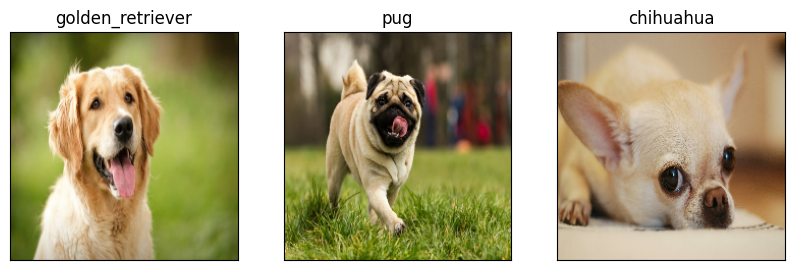

In [99]:
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)